In [1]:
import torch
from IPython.display import Image, clear_output  # to display images

clear_output()
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.10.0+cu102 (NVIDIA GeForce RTX 2070)


In [2]:
import Cython
Cython.__version__

'0.29.23'

# 기본 탐지 형태

detect: weights=['yolov5s.pt'], source=data/images/, imgsz=[640, 640], conf_thres=0.15, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs\detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
image 1/2 C:\Users\medici\Desktop\Python\yolo\yolov5-master\data\images\bus.jpg: 640x480 4 persons, 1 bus, Done. (0.010s)
image 2/2 C:\Users\medici\Desktop\Python\yolo\yolov5-master\data\images\zidane.jpg: 384x640 2 persons, 2 ties, Done. (0.008s)
Speed: 0.0ms pre-process, 9.0ms inference, 5.5ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs\detect\exp5


YOLOv5  2021-10-25 torch 1.10.0+cu102 CUDA:0 (NVIDIA GeForce RTX 2070, 8192.0MB)

Fusing layers... 
Model Summary: 213 layers, 7225885 parameters, 0 gradients
C:\Users\medici\anaconda3\lib\site-packages\torch\functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ..\aten\src\ATen\native\TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


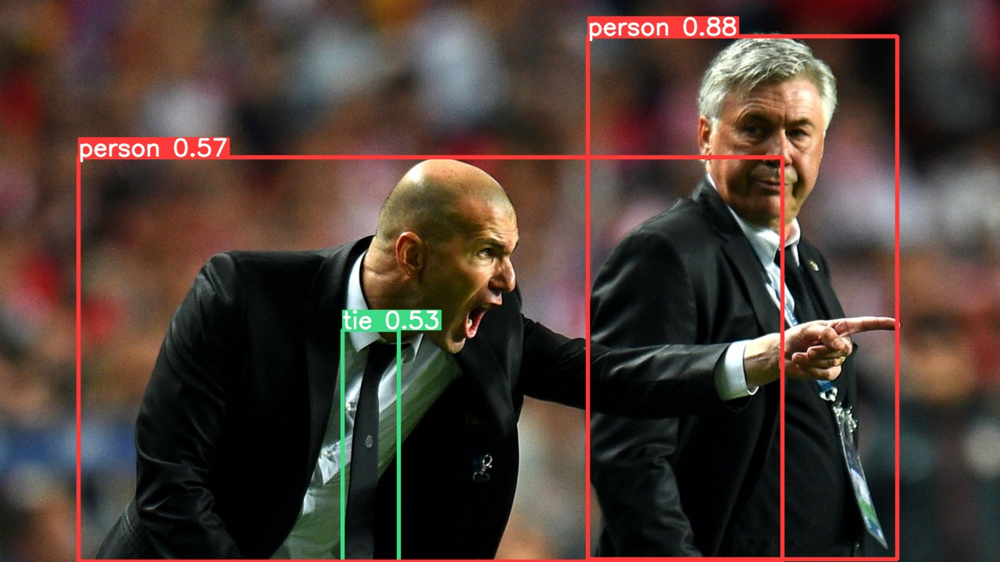

In [2]:
!python detect.py --weights yolov5s.pt --img 640 --conf 0.15 --source data/images/
Image(filename='runs/detect/exp/zidane.jpg', width=600)

In [3]:
# torch.hub.download_url_to_file('https://ultralytics.com/assets/coco2017val.zip', 'tmp.zip')
# !unzip -q tmp.zip -d ../datasets && rm tmp.zip

  0%|          | 0.00/780M [00:00<?, ?B/s]

In [6]:
# Run YOLOv5x on COCO val
!python val.py --weights yolov5x.pt --data ./data/coco.yaml --img 640 --iou 0.65 --half

YOLOv5  2021-10-25 torch 1.10.0+cu102 CUDA:0 (NVIDIA GeForce RTX 2070, 8192.0MB)

Fusing layers... 
Model Summary: 444 layers, 86705005 parameters, 0 gradients
C:\Users\medici\anaconda3\lib\site-packages\torch\functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ..\aten\src\ATen\native\TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]

val: Scanning '..\datasets\coco\val2017' images and labels...:   0%|          | 0/5000 [00:00<?, ?it/s]
val: Scanning '..\datasets\coco\val2017' images and labels...1 found, 0 missing, 0 empty, 0 corrupted:   0%|          | 1/5000 [00:05<8:15:39,  5.95s/it]
val: Scanning '..\datasets\coco\val2017' images and labels...13 found, 0 missing, 0 empty, 0 corrupted:   0%|          | 13/5000 [00:06<27:56,  2.97it/s]
val: Scanning '..\datasets\coco\val2017' images and labels...26 found, 0 missing, 0 empty, 0 corrupted:   1%| 

In [5]:
# Run YOLOv5x on COCO test
!python val.py --weights yolov5x.pt --data ./data/coco.yaml --img 640 --iou 0.65 --half --task test

val: data=./data/coco.yaml, weights=['yolov5x.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.65, task=test, device=, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=True, project=runs\val, name=exp, exist_ok=False, half=True
                 all      20288          0          0          0          0          0
Speed: 0.1ms pre-process, 15.6ms inference, 1.6ms NMS per image at shape (32, 3, 640, 640)

Evaluating pycocotools mAP... saving runs\val\exp13\yolov5x_predictions.json...
loading annotations into memory...
Done (t=0.57s)
creating index...

YOLOv5  2021-10-25 torch 1.10.0+cu102 CUDA:0 (NVIDIA GeForce RTX 2070, 8192.0MB)

Fusing layers... 
Model Summary: 444 layers, 86705005 parameters, 0 gradients
C:\Users\medici\anaconda3\lib\site-packages\torch\functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ..\aten\src\ATen\native\TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]

test: Scanning '..\datasets\coco\test-dev2017' images and labels...:   0%|          | 0/20288 [00:00<?, ?it/s]
test: Scanning '..\datasets\coco\test-dev2017' images and labels...0 found, 1 missing, 0 empty, 0 corrupted:   0%|          | 1/20288 [00:06<37:42:33,  6.69s/it]
test: Scanning '..\datasets\coco\test-dev2017' images and labels...0 found, 14 missing, 0 empty, 0 corrupted:   0%|          | 14/20288 [00:06<1:58:07,  2.86it/s]
test: Scanning '..\datasets\coco\test-dev2017' images and labels...0 found, 27 missing


index created!
Loading and preparing results...
pycocotools unable to run: Results do not correspond to current coco set
Results saved to runs\val\exp13



test: Scanning '..\datasets\coco\test-dev2017' images and labels...0 found, 1313 missing, 0 empty, 0 corrupted:   6%|▋         | 1313/20288 [00:08<00:17, 1067.21it/s]
test: Scanning '..\datasets\coco\test-dev2017' images and labels...0 found, 1424 missing, 0 empty, 0 corrupted:   7%|▋         | 1424/20288 [00:08<00:17, 1069.38it/s]
test: Scanning '..\datasets\coco\test-dev2017' images and labels...0 found, 1534 missing, 0 empty, 0 corrupted:   8%|▊         | 1534/20288 [00:08<00:17, 1078.17it/s]
test: Scanning '..\datasets\coco\test-dev2017' images and labels...0 found, 1644 missing, 0 empty, 0 corrupted:   8%|▊         | 1644/20288 [00:08<00:17, 1082.24it/s]
test: Scanning '..\datasets\coco\test-dev2017' images and labels...0 found, 1754 missing, 0 empty, 0 corrupted:   9%|▊         | 1754/20288 [00:08<00:17, 1072.58it/s]
test: Scanning '..\datasets\coco\test-dev2017' images and labels...0 found, 1865 missing, 0 empty, 0 corrupted:   9%|▉         | 1865/20288 [00:09<00:17, 1081.22it/

# Train YOLOv5s on COCO128 for 3 epochs

In [5]:
!python train.py --img 640 --batch 2 --epochs 3 --data ./data/coco128.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=./data/coco128.yaml, hyp=data\hyps\hyp.scratch.yaml, epochs=3, batch_size=2, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs\train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: skipping check (not a git repository), for updates see https://github.com/ultralytics/yolov5
Weights & Biases: run 'pip install wandb' to automatically track and visualize YOLOv5  runs (RECOMMENDED)
Plotting labels... 

autoanchor: Analyzing anchors... anchors/target = 4.27, Best Possible Recall (BPR) = 0.9935
                 all        128        929      0.729      0.552      0.642      0.419
                 all        12

YOLOv5  2021-10-25 torch 1.10.0+cu102 CUDA:0 (NVIDIA GeForce RTX 2070, 8192.0MB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, translate=0.1, scale=0.5, shear=0.0, perspective=0.0, flipud=0.0, fliplr=0.5, mosaic=1.0, mixup=0.0, copy_paste=0.0
TensorBoard: Start with 'tensorboard --logdir runs\train', view at http://localhost:6006/

                 from  n    params  module                                  arguments                     
  0                -1  1      3520  models.common.Conv                      [3, 32, 6, 2, 2]              
  1                -1  1     18560  models.common.Conv                      [32, 64, 3, 2]                
  2                -1  1     18816  models.common.C3                        [64, 64, 1]                   
  3        


                 dog        128          9      0.839      0.556       0.85      0.582
               horse        128          2      0.676          1      0.995      0.672
            elephant        128         17      0.888      0.824      0.868      0.663
                bear        128          1      0.413          1      0.995      0.995
               zebra        128          4      0.715          1      0.995      0.946
             giraffe        128          9      0.789      0.833      0.912      0.626
            backpack        128          6          1      0.316      0.555       0.23
            umbrella        128         18      0.715      0.696      0.806      0.464
             handbag        128         19      0.624      0.105      0.192      0.129
                 tie        128          7      0.833      0.712      0.745      0.476
            suitcase        128          4      0.732          1      0.945      0.447
             frisbee        128          5


 10                -1  1    131584  models.common.Conv                      [512, 256, 1, 1]              
 11                -1  1         0  torch.nn.modules.upsampling.Upsample    [None, 2, 'nearest']          
 12           [-1, 6]  1         0  models.common.Concat                    [1]                           
 13                -1  1    361984  models.common.C3                        [512, 256, 1, False]          
 14                -1  1     33024  models.common.Conv                      [256, 128, 1, 1]              
 15                -1  1         0  torch.nn.modules.upsampling.Upsample    [None, 2, 'nearest']          
 16           [-1, 4]  1         0  models.common.Concat                    [1]                           
 17                -1  1     90880  models.common.C3                        [256, 128, 1, False]          
 18                -1  1    147712  models.common.Conv                      [128, 128, 3, 2]              
 19          [-1, 14]  1         0  

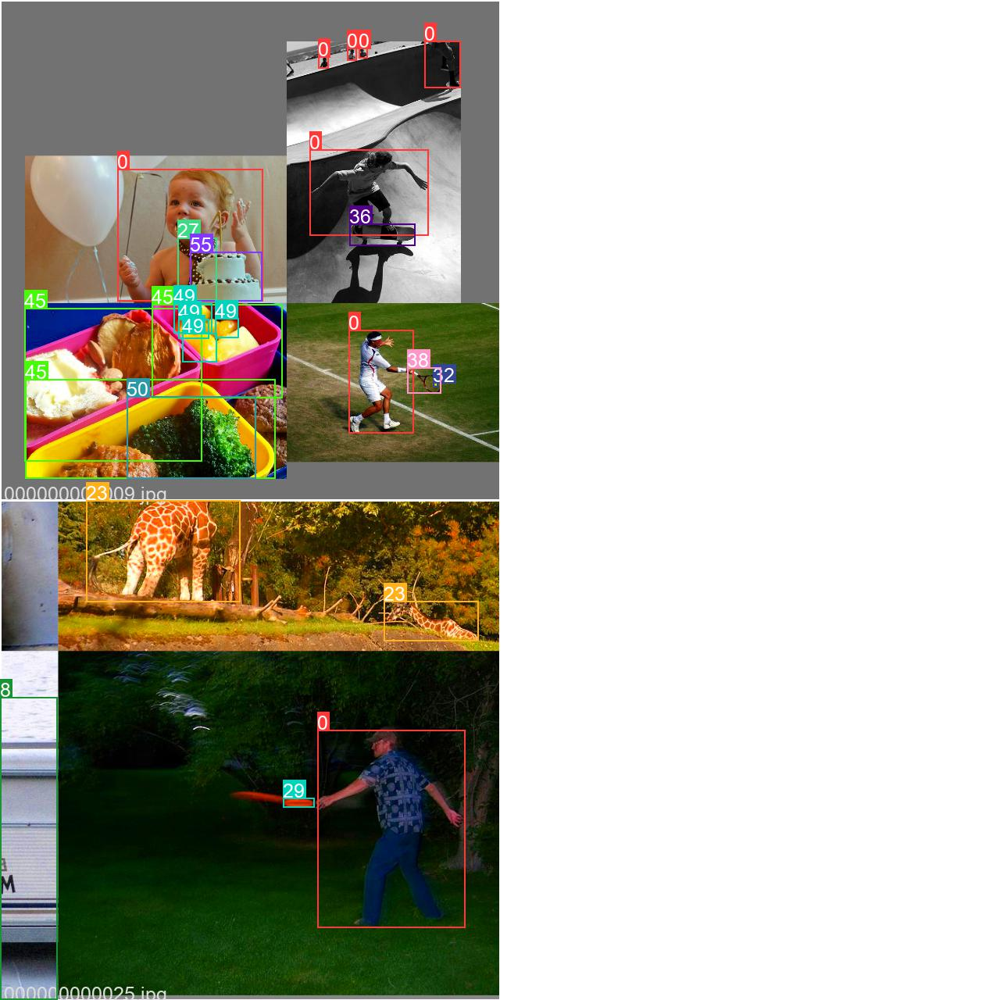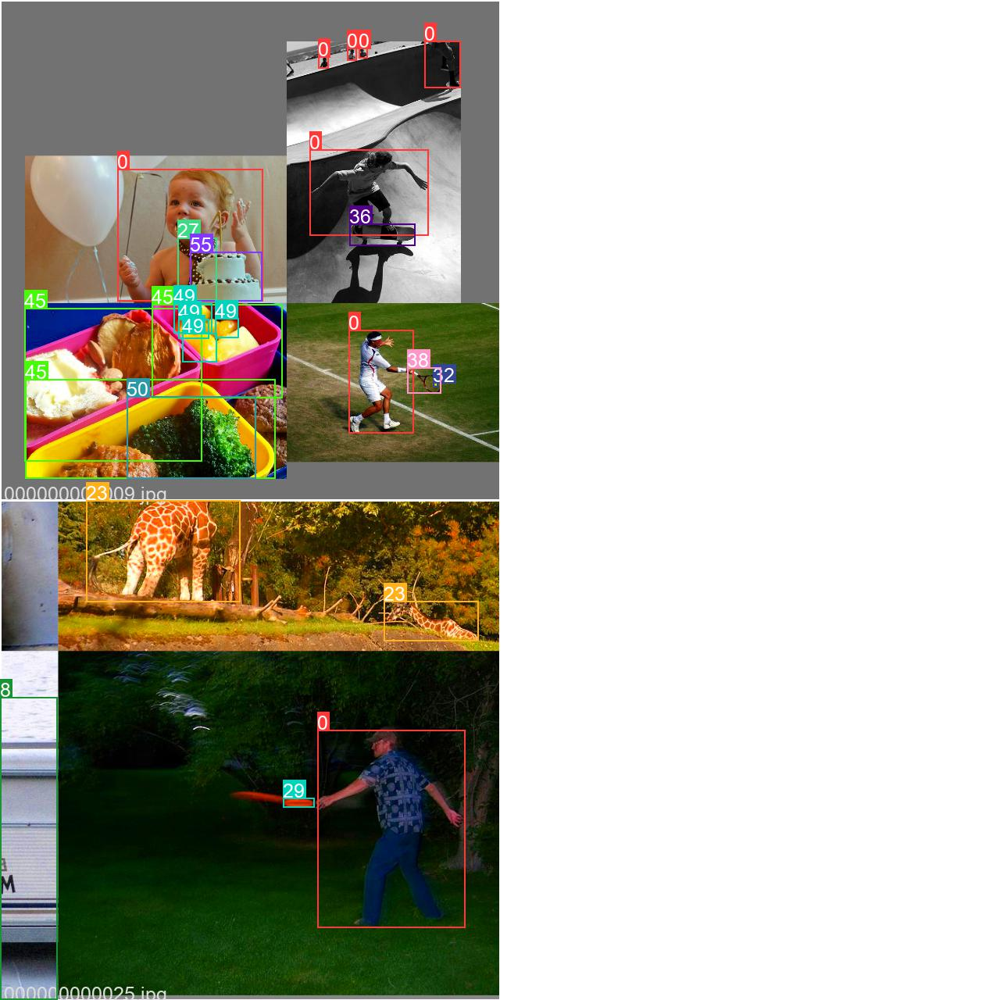

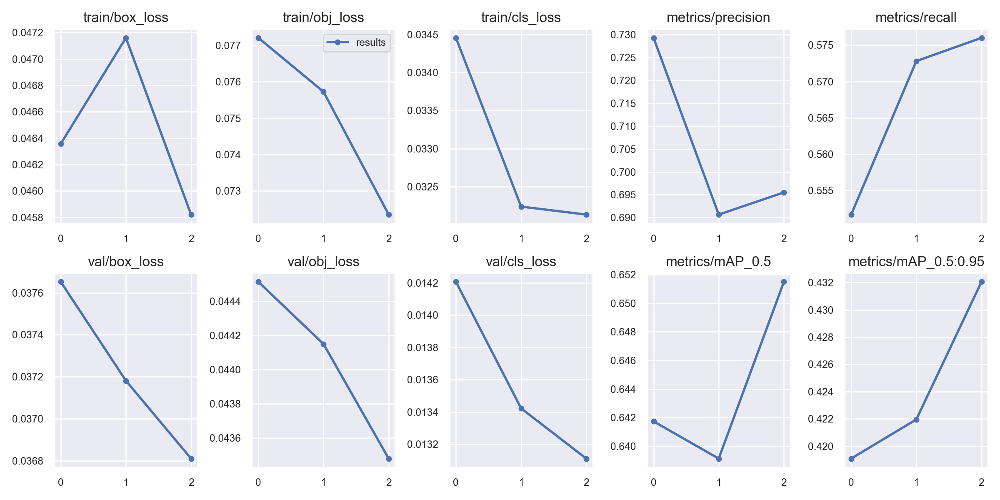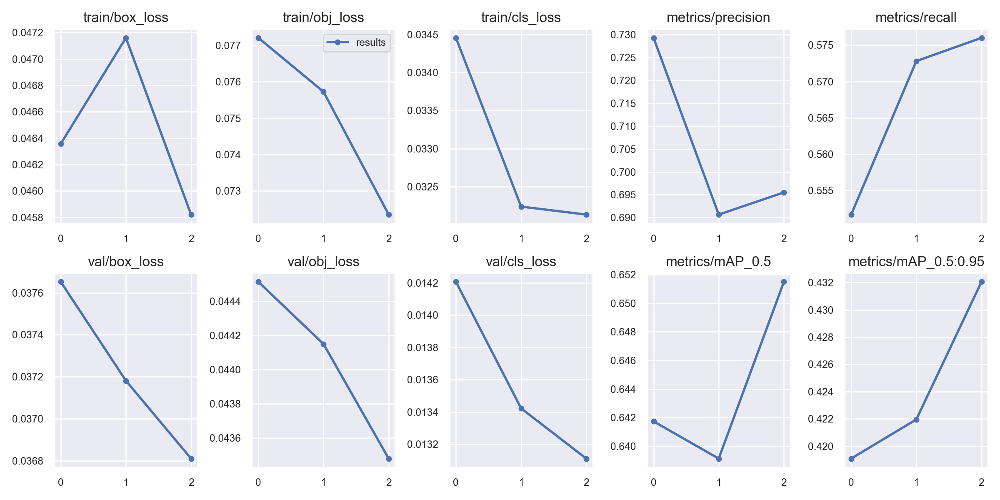

# Train YOLOv5x on COCO128 for 30 epochs

In [13]:
!python train.py --img 640 --batch 2 --epochs 30 --data ./data/coco128.yaml --weights yolov5x.pt --cache

train: weights=yolov5x.pt, cfg=, data=./data/coco128.yaml, hyp=data\hyps\hyp.scratch.yaml, epochs=30, batch_size=2, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs\train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: skipping check (not a git repository), for updates see https://github.com/ultralytics/yolov5
Weights & Biases: run 'pip install wandb' to automatically track and visualize YOLOv5  runs (RECOMMENDED)
Plotting labels... 

autoanchor: Analyzing anchors... anchors/target = 4.27, Best Possible Recall (BPR) = 0.9935
                 all        128        929      0.796      0.737      0.817      0.626
                 all        1

YOLOv5  2021-10-25 torch 1.10.0+cu102 CUDA:0 (NVIDIA GeForce RTX 2070, 8192.0MB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, translate=0.1, scale=0.5, shear=0.0, perspective=0.0, flipud=0.0, fliplr=0.5, mosaic=1.0, mixup=0.0, copy_paste=0.0
TensorBoard: Start with 'tensorboard --logdir runs\train', view at http://localhost:6006/

                 from  n    params  module                                  arguments                     
  0                -1  1      8800  models.common.Conv                      [3, 80, 6, 2, 2]              
  1                -1  1    115520  models.common.Conv                      [80, 160, 3, 2]               
  2                -1  4    309120  models.common.C3                        [160, 160, 4]                 
  3        


            umbrella        128         18      0.915          1      0.995      0.765
             handbag        128         19      0.879      0.789      0.839      0.578
                 tie        128          7      0.935      0.857      0.858      0.709
            suitcase        128          4      0.812          1      0.995      0.896
             frisbee        128          5      0.859        0.8      0.938       0.72
                skis        128          1      0.816          1      0.995      0.796
           snowboard        128          7          1       0.82      0.925      0.649
         sports ball        128          6      0.962      0.833      0.838      0.468
                kite        128         10      0.788        0.7      0.836      0.361
        baseball bat        128          4          1       0.82      0.995      0.682
      baseball glove        128          7      0.967      0.714       0.72      0.496
          skateboard        128          5


      0/29     2.52G   0.02333   0.02833   0.00678        11       640:   0%|          | 0/64 [00:01<?, ?it/s]
      0/29     2.52G   0.02333   0.02833   0.00678        11       640:   2%|▏         | 1/64 [00:04<04:31,  4.32s/it]
      0/29     3.15G   0.02036    0.0289  0.009475        13       640:   2%|▏         | 1/64 [00:04<04:31,  4.32s/it]
      0/29     3.15G   0.02036    0.0289  0.009475        13       640:   3%|▎         | 2/64 [00:04<02:02,  1.98s/it]
      0/29     3.15G   0.02448   0.04169   0.01081        24       640:   3%|▎         | 2/64 [00:04<02:02,  1.98s/it]
      0/29     3.15G   0.02448   0.04169   0.01081        24       640:   5%|▍         | 3/64 [00:04<01:12,  1.18s/it]
      0/29     3.15G   0.02681   0.04677   0.01213        22       640:   5%|▍         | 3/64 [00:05<01:12,  1.18s/it]
      0/29     3.15G   0.02681   0.04677   0.01213        22       640:   6%|▋         | 4/64 [00:05<00:48,  1.24it/s]
      0/29     3.15G   0.03184   0.04271   0.01276     

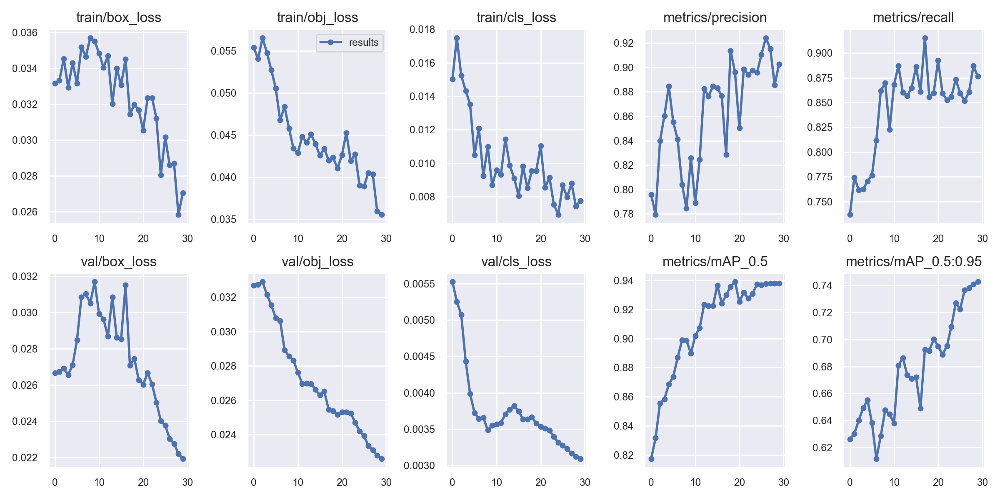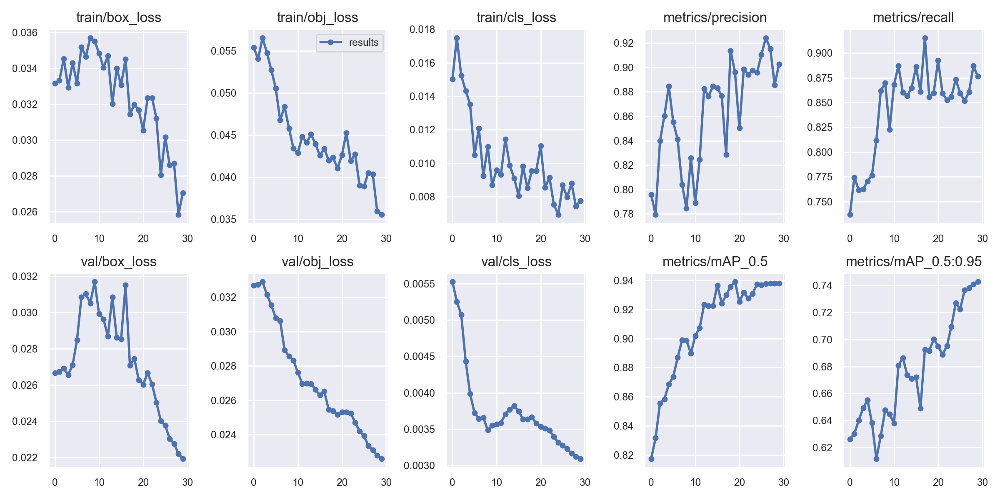

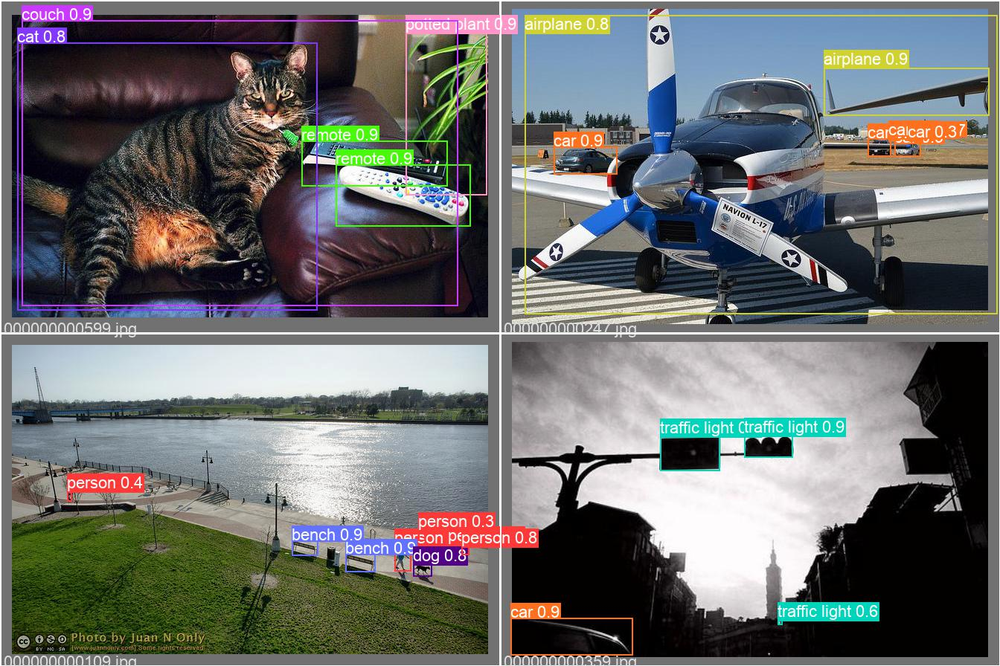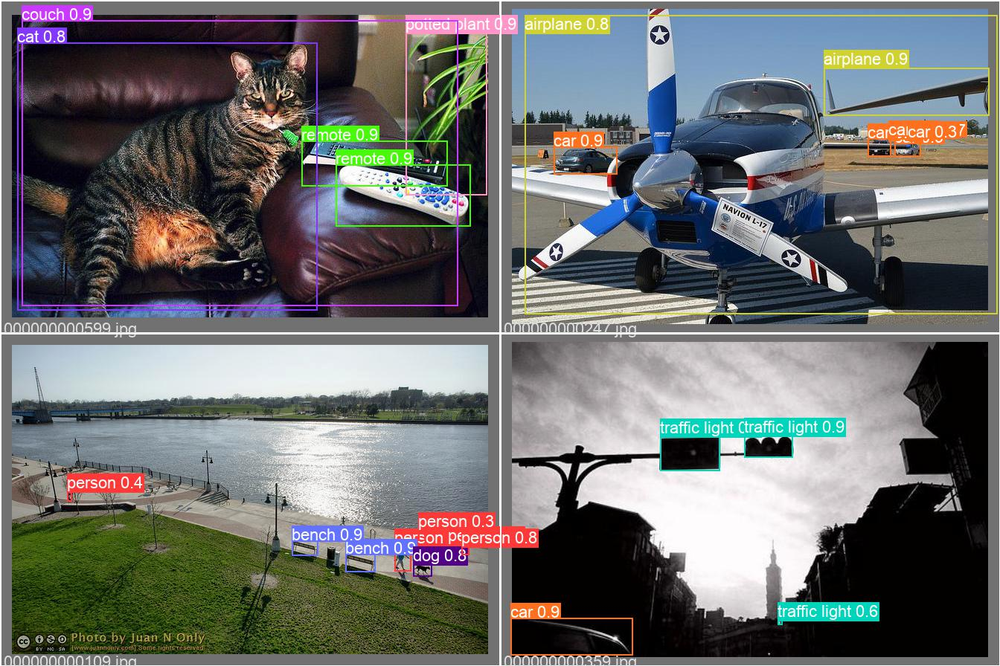